In [ ]:
pip install jupyterlab

Note: you may need to restart the kernel to use updated packages.


In [32]:
import pandas as pd
import streamlit as st 
import csv
import numpy as np 
import matplotlib.pyplot as plt 
from decimal import Decimal
import plotly.express as px
df = pd.read_csv('alunos-ingressantes.csv', sep=';',encoding='latin-1')

df["Curso"]=df["Curso"].replace(["Física - Licenciatura", "Matemática - Licenciatura","Química - Licenciatura","Educação Física - Licenciatura","Ciências Biológicas - Licenciatura"],["Física", "Matemática","Química","Educação Física","Ciências Biológicas"])
display(df)

ModuleNotFoundError: No module named 'streamlit'

In [33]:
df2=df[df["NivelAgrupado"] == "Graduação"]
df3=df2[df2["Campus"] == "Florestal"]
df4=df2[df2["Campus"] == "Viçosa"]
df5=df2[df2["Campus"] == "Rio Paranaíba"]
df3

,CodigoEstudante,Sexo,AnoNascimento,Raca,Naturalidade,UF,Pais,FormaIngresso,GrupoCotaConvocado,AnoAdmissao,Curso,NivelAgrupado,AreaCurso,Turno,SituacaoAluno,SituacaoAlunoAgrupada,Campus
152,F718499C1C8CEF6730F9FD03C8125CAB,M,1963.0,Não informado,Contagem,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Abandono,Evasão,Florestal
153,3A1DD98341FAFC1DFE9BCF36360E6B84,M,1977.0,Não informado,Florestal,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Abandono,Evasão,Florestal
154,F976B57BB9DD27AA2E7E7DF2825893A6,F,1991.0,Preto(a),Florestal,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Conclusão,Conclusão,Florestal
155,AB8AA05E782481F55FC1412A97E7AC34,F,1987.0,Branco(a),Florestal,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Conclusão,Conclusão,Florestal
156,332647F433A1C10FA2E2AE04ABFDF83E,M,1990.0,Branco(a),Pará de Minas,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Desligamento,Evasão,Florestal
157,F9FD2624BEEFBC7808E4E405D73F57AB,F,1990.0,Branco(a),Pará de Minas,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Conclusão,Conclusão,Florestal
158,A57E8915461B83ADEFB011530B711704,M,1993.0,Pardo(a),Pará de Minas,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Desligamento,Evasão,Florestal
159,379A7BA015D8BF1C70B8ADD2C287C6FA,F,1987.0,Branco(a),Pará de Minas,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Conclusão,Conclusão,Florestal
160,3C333AADFC3EE8ECB8D77EE31197D96A,F,1990.0,Preto(a),Florestal,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Abandono,Evasão,Florestal
161,B8B9C74AC526FFFBEB2D39AB038D1CD7,F,1988.0,Branco(a),Pará de Minas,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Conclusão,Conclusão,Florestal


In [34]:
df_group1 = df3.groupby("AnoAdmissao").count().reset_index()
df_group1[['AnoAdmissao','Campus']]
dg1=df_group1[['AnoAdmissao','Campus']].rename(columns={
    "AnoAdmissao": "AnoAdmissao",
    "Campus": "Florestal"})
dg1

,AnoAdmissao,Florestal
0,2010,369
1,2011,318
2,2012,382
3,2013,384
4,2014,407
5,2015,392
6,2016,429
7,2017,455
8,2018,423
9,2019,427


In [35]:
df_group2 = df4.groupby("AnoAdmissao").count().reset_index()
df_group2[['AnoAdmissao','Campus']]

dg2=df_group2[['AnoAdmissao','Campus']].rename(columns={
    "AnoAdmissao": "AnoAdmissao",
    "Campus": "Viçosa"})
dg2

,AnoAdmissao,Viçosa
0,2010,2846
1,2011,3592
2,2012,2792
3,2013,3086
4,2014,3145
5,2015,3176
6,2016,3245
7,2017,3366
8,2018,3321
9,2019,3077


In [36]:
data_df = df3.groupby(['AnoAdmissao', 'Curso']).agg(avg_age=('AnoAdmissao', 'mean'), count=('AnoAdmissao', 'count'))
  
data_df = data_df.reset_index() 
print(data_df.head()) 
data_df.shape 


   AnoAdmissao                    Curso  avg_age  count
0         2010                Agronomia   2010.0     59
1         2010      Ciências Biológicas   2010.0     27
2         2010          Educação Física   2010.0     63
3         2010  Engenharia de Alimentos   2010.0     59
4         2010                   Física   2010.0     20


(162, 4)

In [37]:
t=df3.groupby(['AnoAdmissao', 'Curso']).agg(avg_age=('AnoAdmissao', 'mean'), count=('AnoAdmissao', 'count'))

In [38]:
t

avg_age  count
AnoAdmissao Curso                                                             
2010        Agronomia                                            2010.0     59
            Ciências Biológicas                                  2010.0     27
            Educação Física                                      2010.0     63
            Engenharia de Alimentos                              2010.0     59
            Física                                               2010.0     20
            Matemática                                           2010.0     17
            Química                                              2010.0     25
            Tecnologia em Análise e Desenvolvimento de Sist...   2010.0     48
            Tecnologia em Gestão Ambiental                       2010.0     51
2011        Administração                                        2011.0     60
            Agronomia                                            2011.0     50
            Ciências Biológicas                                  2011.0     25
            Educação Física                                      2011.0     25
            Engenharia de Alimentos                              2011.0     46
            Estudante Não VInculado                              2011.0      1
            Física                                               2011.0     15
            Matemática                                           2011.0     11
            Química                                              2011.0     20
            Tecnologia em Análise e Desenvolvimento de Sist...   2011.0     37
            Tecnologia em Gestão Ambiental                       2011.0     28
2012        Administração                                        2012.0     63
            Agronomia                                            2012.0     47
            Ciência da Computação                                2012.0     50
            Ciências Biológicas                                  2012.0     27
            Educação Física                                      2012.0     51
            Engenharia de Alimentos                              2012.0     46
            Física                                               2012.0     19
            Matemática                                           2012.0     21
            Química                                              2012.0     26
            Tecnologia em Gestão Ambiental                       2012.0     32
2013        Administração                                        2013.0     65
            Agronomia                                            2013.0     46
            Ciência da Computação                                2013.0     51
            Ciências Biológicas                                  2013.0     27
            Educação Física                                      2013.0     52
            Engenharia de Alimentos                              2013.0     45
            Estudante Não VInculado                              2013.0      2
            Física                                               2013.0     18
            Matemática                                           2013.0     11
            Mobilidade Acadêmica - Graduação                     2013.0      2
            Química                                              2013.0     26
            Tecnologia em Gestão Ambiental                       2013.0     39
2014        Administração                                        2014.0     67
            Agronomia                                            2014.0     53
            Ciência da Computação                                2014.0     56
            Ciências Biológicas                                  2014.0     29
            Educação Física                                      2014.0     57
            Engenharia de Alimentos                              2014.0     47
            Física                                               2014.0     15
            Matemática             

In [39]:
# replace column values with collection


In [40]:
fig = px.bar(data_df, x="AnoAdmissao", y="count", color="Curso", barmode="group")
fig

In [41]:
df_group3 = df5.groupby("AnoAdmissao").count().reset_index()
df_group3[['AnoAdmissao','Campus']]

dg3=df_group3[['AnoAdmissao','Campus']].rename(columns={
    "AnoAdmissao": "AnoAdmissao",
    "Campus": "Rio Paranaíba"})
dg3

,AnoAdmissao,Rio Paranaíba
0,2010,630
1,2011,559
2,2012,607
3,2013,560
4,2014,614
5,2015,614
6,2016,661
7,2017,647
8,2018,683
9,2019,638


In [42]:
m = pd.merge(dg1, dg2, on = "AnoAdmissao")
m

,AnoAdmissao,Florestal,Viçosa
0,2010,369,2846
1,2011,318,3592
2,2012,382,2792
3,2013,384,3086
4,2014,407,3145
5,2015,392,3176
6,2016,429,3245
7,2017,455,3366
8,2018,423,3321
9,2019,427,3077


In [43]:
m1 = pd.merge(m, dg3, on = "AnoAdmissao")
m1

,AnoAdmissao,Florestal,Viçosa,Rio Paranaíba
0,2010,369,2846,630
1,2011,318,3592,559
2,2012,382,2792,607
3,2013,384,3086,560
4,2014,407,3145,614
5,2015,392,3176,614
6,2016,429,3245,661
7,2017,455,3366,647
8,2018,423,3321,683
9,2019,427,3077,638


<Axes: xlabel='AnoAdmissao'>

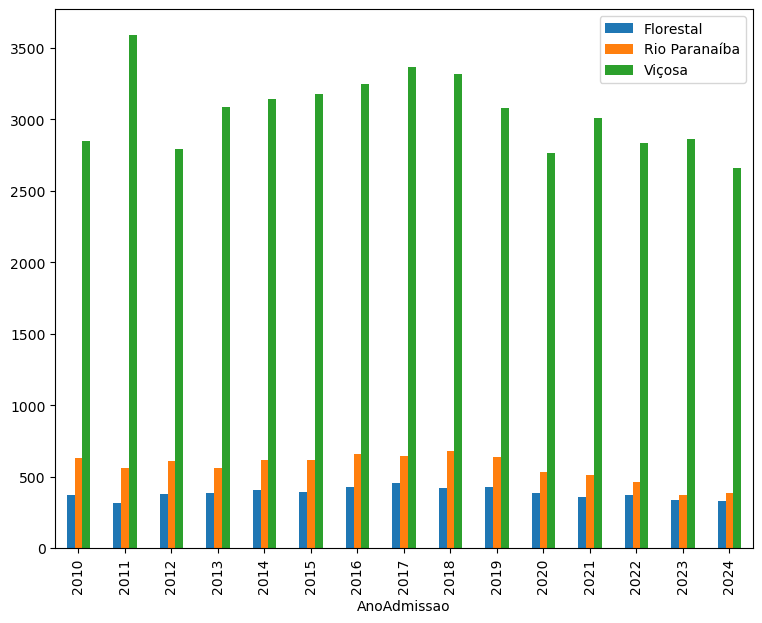

In [44]:
m1.plot(x="AnoAdmissao", y=["Florestal","Rio Paranaíba","Viçosa"], kind="bar", figsize=(9, 7))

In [45]:
dh3=df3[df3["SituacaoAluno"] == "Conclusão"]
dh4=df4[df4["SituacaoAluno"] == "Conclusão"]
dh5=df5[df5["SituacaoAluno"] == "Conclusão"]
dh3

,CodigoEstudante,Sexo,AnoNascimento,Raca,Naturalidade,UF,Pais,FormaIngresso,GrupoCotaConvocado,AnoAdmissao,Curso,NivelAgrupado,AreaCurso,Turno,SituacaoAluno,SituacaoAlunoAgrupada,Campus
154,F976B57BB9DD27AA2E7E7DF2825893A6,F,1991.0,Preto(a),Florestal,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Conclusão,Conclusão,Florestal
155,AB8AA05E782481F55FC1412A97E7AC34,F,1987.0,Branco(a),Florestal,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Conclusão,Conclusão,Florestal
157,F9FD2624BEEFBC7808E4E405D73F57AB,F,1990.0,Branco(a),Pará de Minas,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Conclusão,Conclusão,Florestal
159,379A7BA015D8BF1C70B8ADD2C287C6FA,F,1987.0,Branco(a),Pará de Minas,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Conclusão,Conclusão,Florestal
161,B8B9C74AC526FFFBEB2D39AB038D1CD7,F,1988.0,Branco(a),Pará de Minas,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Conclusão,Conclusão,Florestal
163,9E82757E9A1C12CB710AD680DB11F6F1,F,1993.0,Branco(a),Pará de Minas,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Conclusão,Conclusão,Florestal
166,B5B03F06271F8917685D14CEA7C6C50A,F,1989.0,Pardo(a),Arcos,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Conclusão,Conclusão,Florestal
167,DBA31BB5C75992690F20C2D3B370EC7C,F,1990.0,Preto(a),Pavão,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Conclusão,Conclusão,Florestal
168,EF67F7C2D86352C2C42E19D20F881F53,M,1989.0,Branco(a),Belo Horizonte,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Conclusão,Conclusão,Florestal
169,C68C9C8258EA7D85472DD6FD0015F047,F,1993.0,Branco(a),Pará de Minas,MG,Brasil,Vestibular,Não informado ou não se aplica,2011,Administração,Graduação,"Ciências Humanas, Letras e Artes",Noturno,Conclusão,Conclusão,Florestal


In [46]:
data_dh = dh3.groupby(['AnoAdmissao', 'Curso']).agg(avg_age=('AnoAdmissao', 'mean'), count=('AnoAdmissao', 'count'))
  
data_dh = data_dh.reset_index() 
print(data_dh.head()) 
data_dh.shape 

   AnoAdmissao                    Curso  avg_age  count
0         2010                Agronomia   2010.0     24
1         2010      Ciências Biológicas   2010.0     18
2         2010          Educação Física   2010.0     29
3         2010  Engenharia de Alimentos   2010.0     22
4         2010                   Física   2010.0      4


(110, 4)

In [47]:
df_group3 = dh3.groupby("AnoAdmissao").count().reset_index()
df_group3[['AnoAdmissao','Campus']]

dt=df_group3[['AnoAdmissao','Campus']].rename(columns={
    "AnoAdmissao": "AnoAdmissao",
    "Campus": "Florestal"})
dt

,AnoAdmissao,Florestal
0,2010,171
1,2011,145
2,2012,132
3,2013,122
4,2014,155
5,2015,136
6,2016,150
7,2017,148
8,2018,127
9,2019,74


In [48]:
fig2 = px.line(data_dh, x="AnoAdmissao", y="count", color="Curso")
fig2

In [49]:
pd.set_option('display.max_rows', None)
df_group4 = df3.groupby("Naturalidade").count().reset_index()
df_group4[['Naturalidade','Campus']]

dl=df_group4[['Naturalidade','Campus']].rename(columns={
    "Naturalidade": "Naturalidade",
    "Campus": "Florestal"})

dl.sort_values(by='Florestal', ascending=False)

 

,Naturalidade,Florestal
47,Belo Horizonte,1567
358,Pará de Minas,754
53,Betim,341
136,Contagem,294
300,Mateus Leme,170
540,Viçosa,169
492,São Paulo,124
155,Divinópolis,103
235,Itaúna,95
459,Sete Lagoas,70


In [50]:
pd.set_option('display.max_rows', None)
df_group5 = df4.groupby("Naturalidade").count().reset_index()
df_group5[['Naturalidade','Campus']]

dk=df_group5[['Naturalidade','Campus']].rename(columns={
    "Naturalidade": "Naturalidade",
    "Campus": "Viçosa"})

dk.sort_values(by='Viçosa', ascending=False)
dv=dk.sort_values(by='Viçosa', ascending=False)
dv
 

,Naturalidade,Viçosa
2465,Viçosa,8929
228,Belo Horizonte,2548
1749,Ponte Nova,1976
2377,Ubá,1551
2460,Visconde do Rio Branco,1270
2228,São Paulo,1239
987,Ipatinga,1135
1878,Rio de Janeiro,694
1454,Muriaé,650
725,Ervália,627


In [51]:
pd.set_option('display.max_rows', None)
df_group6 = df5.groupby("Naturalidade").count().reset_index()
df_group6[['Naturalidade','Campus']]

dk1=df_group6[['Naturalidade','Campus']].rename(columns={
    "Naturalidade": "Naturalidade",
    "Campus": "Rio Paranaíba"})

dk1.sort_values(by='Rio Paranaíba', ascending=False)
drp=dk1.sort_values(by='Rio Paranaíba', ascending=False)
drp

,Naturalidade,Rio Paranaíba
671,São Gotardo,1206
593,Rio Paranaíba,630
149,Carmo do Paranaíba,625
509,Patos de Minas,497
77,Belo Horizonte,411
45,Araxá,287
690,São Paulo,250
511,Patrocínio,213
281,Ibiá,171
766,Viçosa,165


In [52]:
dm=dl.sort_values(by='Florestal', ascending=False)
dm

,Naturalidade,Florestal
47,Belo Horizonte,1567
358,Pará de Minas,754
53,Betim,341
136,Contagem,294
300,Mateus Leme,170
540,Viçosa,169
492,São Paulo,124
155,Divinópolis,103
235,Itaúna,95
459,Sete Lagoas,70


In [53]:
dfAM = pd.read_csv('Alunos Matriculados.csv', sep=';',encoding='latin-1')

display(dfAM)

,Áreas/Cursos,Mat. Sem. 1 M,Mat. Sem. 1 F,Mat. Sem. 1 Total,Mat. Sem. 2 M,Mat. Sem. 2F,Mat. Sem. 2 Total,Dip. Sem. 1 M,Dip. Sem. 1 F,Dip. Sem. 1 Total,Dip. Sem. 2 M,Dip. Sem. 2F,Dip. Sem. 2 Total,Ano
0,AGRONOMIA,146,111,257,0,0,0,0,0,0,0,0,0,2024
1,MOBILIDADE ACADÊMICA - PROMOVER,0,0,0,0,0,0,0,0,0,0,0,0,2024
2,CIÊNCIAS BIOLÓGICAS - LICENCIATURA,46,83,129,0,0,0,0,1,1,0,0,0,2024
3,EDUCAÇÃO FÍSICA - LICENCIATURA,117,54,171,0,0,0,0,0,0,0,0,0,2024
4,CIÊNCIA DA COMPUTAÇÃO,184,55,239,0,0,0,0,0,0,0,0,0,2024
5,ENGENHARIA DE ALIMENTOS,32,111,143,0,0,0,0,0,0,0,0,0,2024
6,FÍSICA - LICENCIATURA,16,5,21,0,0,0,0,0,0,0,0,0,2024
7,MATEMÁTICA - LICENCIATURA,10,16,26,0,0,0,0,0,0,0,0,0,2024
8,QUÍMICA - LICENCIATURA,9,22,31,0,0,0,0,0,0,0,0,0,2024
9,TECNOLOGIA EM ANÁLISE E DESENVOLVIMENTO DE SI...,0,0,0,0,0,0,0,0,0,0,0,0,2024


In [54]:
data_dfAM = dfAM.groupby(['Ano', 'Áreas/Cursos']).agg(avg_age=('Ano', 'mean'), count1=('Mat. Sem. 1 Total', 'sum'), count2=('Mat. Sem. 2 Total', 'sum'))
  
data_dfAM = data_dfAM.reset_index() 
print(data_dfAM.head()) 
data_dfAM.shape

    Ano              Áreas/Cursos  avg_age  count1  count2
0  2010                 AGRONOMIA   2010.0      58      54
1  2010       CIÊNCIAS BIOLÓGICAS   2010.0      51      46
2  2010           EDUCAÇÃO FÍSICA   2010.0      60      57
3  2010   ENGENHARIA DE ALIMENTOS   2010.0      58      51
4  2010                    FÍSICA   2010.0      12      25


(190, 5)

In [55]:
data_dgAM = data_dfAM.groupby(['Ano']).agg(avg_age=('Ano', 'mean'), Semestre_1=('count1', 'sum'), Semestre_2=('count2', 'sum'))
  
data_dgAM = data_dgAM.reset_index() 
print(data_dgAM.head()) 
data_dgAM.shape

    Ano  avg_age  Semestre_1  Semestre_2
0  2010   2010.0         467         425
1  2011   2011.0         671         614
2  2012   2012.0         897         727
3  2013   2013.0         980         840
4  2014   2014.0        1126         978


(15, 4)

In [56]:
data_dfAD = dfAM.groupby(['Ano', 'Áreas/Cursos']).agg(avg_age=('Ano', 'mean'), count1=('Dip. Sem. 1 Total', 'sum'), count2=('Dip. Sem. 2 Total', 'sum'))
  
data_dfAD = data_dfAD.reset_index() 
print(data_dfAD.head()) 
data_dfAD.shape

    Ano              Áreas/Cursos  avg_age  count1  count2
0  2010                 AGRONOMIA   2010.0       0       0
1  2010       CIÊNCIAS BIOLÓGICAS   2010.0       0       0
2  2010           EDUCAÇÃO FÍSICA   2010.0       0       0
3  2010   ENGENHARIA DE ALIMENTOS   2010.0       0       0
4  2010                    FÍSICA   2010.0       0       0


(190, 5)

In [57]:
data_dgAD = data_dfAD.groupby(['Ano']).agg(avg_age=('Ano', 'mean'), Semestre_1=('count1', 'sum'), Semestre_2=('count2', 'sum'))
  
data_dgAD = data_dgAD.reset_index() 
print(data_dgAD.head()) 
data_dgAD.shape

    Ano  avg_age  Semestre_1  Semestre_2
0  2010   2010.0          16           7
1  2011   2011.0           7          21
2  2012   2012.0          23          28
3  2013   2013.0          20          24
4  2014   2014.0          33          67


(15, 4)

In [58]:

f = data_dgAD.eval('Formandos =Semestre_1+ Semestre_2')
print(f)

     Ano  avg_age  Semestre_1  Semestre_2  Formandos
0   2010   2010.0          16           7         23
1   2011   2011.0           7          21         28
2   2012   2012.0          23          28         51
3   2013   2013.0          20          24         44
4   2014   2014.0          33          67        100
5   2015   2015.0          41          59        100
6   2016   2016.0          57          81        138
7   2017   2017.0          56          66        122
8   2018   2018.0          72          96        168
9   2019   2019.0          60          85        145
10  2020   2020.0          52          41         93
11  2021   2021.0          60          70        130
12  2022   2022.0          66          75        141
13  2023   2023.0          90          90        180
14  2024   2024.0           1           0          1


In [59]:
cid0=df3.loc[(df3["Naturalidade"] == 'Belo Horizonte') | (df3["Naturalidade"] == 'Betim')| (df3["Naturalidade"] == 'Pará de Minas')]
cid = cid0.groupby(['AnoAdmissao', 'Naturalidade']).agg(avg_age=('AnoAdmissao', 'mean'), count=('AnoAdmissao', 'count'))
cid = cid.reset_index()  
cid

,AnoAdmissao,Naturalidade,avg_age,count
0,2010,Belo Horizonte,2010.0,64
1,2010,Betim,2010.0,2
2,2010,Pará de Minas,2010.0,68
3,2011,Belo Horizonte,2011.0,71
4,2011,Betim,2011.0,5
5,2011,Pará de Minas,2011.0,73
6,2012,Belo Horizonte,2012.0,93
7,2012,Betim,2012.0,4
8,2012,Pará de Minas,2012.0,64
9,2013,Belo Horizonte,2013.0,105


In [60]:
cidc=df3.loc[(df3["Naturalidade"] == 'Belo Horizonte') | (df3["Naturalidade"] == 'Betim')| (df3["Naturalidade"] == 'Pará de Minas')]
cidcc = cidc.groupby(['AnoAdmissao', 'Naturalidade','Curso']).agg(avg_age=('AnoAdmissao', 'mean'), count=('AnoAdmissao', 'count'))
cidcc = cidcc.reset_index()  
cidcc

,AnoAdmissao,Naturalidade,Curso,avg_age,count
0,2010,Belo Horizonte,Agronomia,2010.0,14
1,2010,Belo Horizonte,Ciências Biológicas,2010.0,8
2,2010,Belo Horizonte,Educação Física,2010.0,6
3,2010,Belo Horizonte,Engenharia de Alimentos,2010.0,7
4,2010,Belo Horizonte,Física,2010.0,8
5,2010,Belo Horizonte,Matemática,2010.0,1
6,2010,Belo Horizonte,Química,2010.0,5
7,2010,Belo Horizonte,Tecnologia em Análise e Desenvolvimento de Sis...,2010.0,10
8,2010,Belo Horizonte,Tecnologia em Gestão Ambiental,2010.0,5
9,2010,Betim,Educação Física,2010.0,1


In [65]:
# Run this app with `python app.py` and
# visit http://127.0.0.1:8050/ in your web browser.


from dash import Dash, dcc, html, Input, Output, callback, dash_table

import plotly.express as px
import dash_bootstrap_components as dbc
from dash import html
import plotly.graph_objects as go

app = Dash(__name__,external_stylesheets = [dbc.themes.BOOTSTRAP])

 
external_stylesheets = [dbc.themes.BOOTSTRAP]



# assume you have a "long-form" data frame
# see https://plotly.com/python/px-arguments/ for more options

 
fig = px.bar(data_df, x="AnoAdmissao", y="count", color="Curso", barmode="group")
opcoes=list(data_df['Curso'].unique())
opcoes.append('Todos os cursos')

a1=px.line(m1, x="AnoAdmissao", y=["Florestal","Rio Paranaíba","Viçosa"],width=750, height=400)
# print bar graph
a2=px.bar(m1,x="AnoAdmissao", y=["Florestal","Rio Paranaíba","Viçosa"],barmode="group",width=750, height=400)


a3=px.bar(data_dgAM,x="Ano", y=["Semestre_1","Semestre_2"],barmode="group",width=850, height=400, text_auto='', title="Alunos Matriculados no campus UFV-Florestal")
a3.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

a4=px.bar(f,x="Ano", y="Formandos",width=650, height=400, text_auto='', title="Formandos no campus UFV-Florestal")
a4.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

a5=px.line(cid, x="AnoAdmissao", y="count",color="Naturalidade", width=750, height=400, title="Campus UFV-Florestal por cidade")

a6=px.line(cidcc, x="AnoAdmissao", y="count",color="Curso", width=750, height=400, title="CDC por cidade")
 


app.layout = html.Div([
     dbc.Row(
            [
                   html.H1(
                     children='Entrada de alunos na UFV desde 2010',
                     style={
                    'textAlign': 'center'}
                     ),
            ]),
     
         dbc.Row(
            [    dbc.Col(     
                         dcc.Graph( id='example-graph-4',
                 figure=a2), 
                      width=6,
                         
     ),
     dbc.Col(
                 dcc.Graph( id='example-graph-3',
                 figure=a1), 
         width=6
         
      ),
            ]),

    
 dbc.Row([    
html.Div( [
     dbc.Row([ 
                  html.Label('Entrada de alunos por curso-UFV-Florestal'),
                  dcc.Dropdown(opcoes, value='Todos os cursos',id= 'Curso', 
                  style={'padding': 4, 'flex': 1}),       
                   
                 dcc.Graph(
                 id='example-graph-2',
                 figure=fig),
     ]),
    
        dbc.Row(
            [ 
                dbc.Col(
                    dcc.Graph( id='example-graph-5',
                 figure=a3), 
                    width=7
                ), 
                dbc.Col(
                    dcc.Graph( id='example-graph-6',
                 figure=a4),
                    width=5
                ),
            ]),
    dbc.Row([
         dbc.Col(
               dcc.Graph( id='example-graph-7',
                 figure=a5), 
             width=6
         ),          
          dbc.Col(
               dcc.Graph( id='example-graph-8',
                 figure=a6), 
             width=6
         ),                         
        
    ]),
     dbc.Row([    
       
    html.H4('Cidades dos alunos matriculados nos campi da UFV'),
   dbc.Col(
         dash_table.DataTable(
    data=dm.to_dict('records'),
    columns=[{'id': c, 'name': c} for c in dm.columns],
    page_size=10,
    style_cell=dict(textAlign='left'),
    style_header=dict(backgroundColor="paleturquoise"),
    style_data=dict(backgroundColor="lavender"),
),
           width=3,
       ),
         
         dbc.Col(
         dash_table.DataTable(
    data=dv.to_dict('records'),
    columns=[{'id': c, 'name': c} for c in dv.columns],
    page_size=10,
    style_cell=dict(textAlign='left'),
    style_header=dict(backgroundColor="paleturquoise"),
    style_data=dict(backgroundColor="lavender"),
),
           width=3,
       ),
   dbc.Col(
         dash_table.DataTable(
    data=drp.to_dict('records'),
    columns=[{'id': c, 'name': c} for c in drp.columns],
    page_size=10,
    style_cell=dict(textAlign='left'),
    style_header=dict(backgroundColor="paleturquoise"),
    style_data=dict(backgroundColor="lavender"),
),
           width=3,
       ),
         
 ],
     style={"height":"10vh"}, 
 ),
 
    
]),



     
 ]),              

])            
 
 
@app.callback(
    Output(component_id='example-graph-2', component_property='figure'),
    Input(component_id='Curso', component_property='value')
)
def update_output(value):

    return fig

 

if __name__ == '__main__':
    app.run(port=8051)(debug=True)

TypeError: 'NoneType' object is not callable

<Axes: xlabel='AnoAdmissao'>

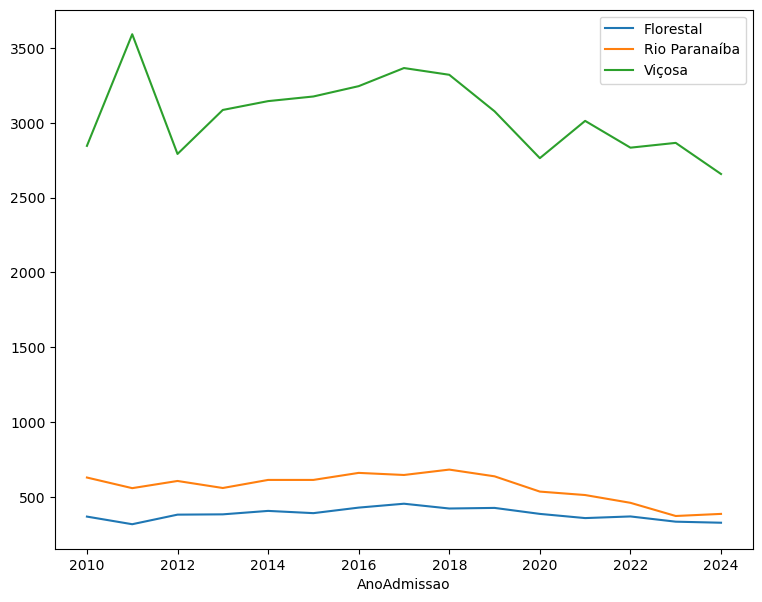

In [62]:
 

m1.plot(x="AnoAdmissao", y=["Florestal","Rio Paranaíba","Viçosa"], kind="line", figsize=(9, 7))


In [ ]:
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode(connected=True)
trace1 = go.Bar(x = ['Banana', 'Maçã', 'Uva'],
                y = [10, 20, 30])
trace2 = go.Bar(x = ['Banana', 'Maçã', 'Uva'],
                y = [20, 30, 40])
data = [trace1, trace2]
py.iplot(data)

In [ ]:
if value=='Todos os cursos':
        fig=px.bar(data_df, x="AnoAdmissao", y="count", color="Curso", barmode="group"),
    else:
     tabela_filtrada = data_df.loc[data_df['Curso']==value, :],
    fig = px.bar(tabela_filtrada, x="AnoAdmissao", y="count", color="Curso", barmode="group"),

In [ ]:
data_df.loc[data_df['Curso'], :]

In [ ]:
from dash import Dash, html, Input, Output, dash_table
import pandas as pd

data_url = 'https://raw.githubusercontent.com/plotly/datasets/master/2014_usa_states.csv'
df = pd.read_csv(data_url) # replace with your own data source

app = Dash(__name__)


app.layout = html.Div([
    html.H4('Simple interactive table'),
    html.P(id='table_out'),
    dash_table.DataTable(
        id='table',
        columns=[{"name": i, "id": i} 
                 for i in dm.columns],
        data=dm.to_dict('records'),
        style_cell=dict(textAlign='left'),
        style_header=dict(backgroundColor="paleturquoise"),
        style_data=dict(backgroundColor="lavender")
    ), 
])

@app.callback(
    Output('table_out', 'children'), 
    Input('table', 'active_cell'))
def update_graphs(active_cell):
    if active_cell:
        cell_data = dm.iloc[active_cell['row']][active_cell['column_id']]
        return f"Data: \"{cell_data}\" from table cell: {active_cell}"
    return "Click the table"
app.run(port=8051)(debug=True)